# BIG DATA FINAL PROJECT: NOTEBOOK 2/2
# Graph Building & Analysis
## Nazih Kalo, Andrew Luong, Hoang Nguyen

In [3]:
from pyspark.context import SparkContext
from pyspark.sql import SparkSession

In [4]:
import pandas as pd 
import json
import matplotlib.pyplot as plt 

#Graph network imports
from graphframes import *
from pyspark import *
from pyspark.sql import *
import numpy as np
from pyspark.ml.linalg import *
from pyspark.ml.linalg import *
from pyspark.sql.types import * 
from pyspark.sql.functions import *
from functools import reduce
from pyspark.sql.functions import col, lit, when

from pyspark.sql.functions import udf #user defined function
from pyspark.sql.types import * #Import types == IntegerType, StringType etc.

import nltk

import networkx as nx

In [5]:
spark = SparkSession.builder.appName('Graph_Analysis').getOrCreate()
sc = SparkContext.getOrCreate()

### Read data

In [3]:
spark_df = spark.read.parquet('big_data_project/encodedData/')

In [4]:
spark_df.printSchema()

root
 |-- fieldsOfStudy: string (nullable = true)
 |-- id: string (nullable = true)
 |-- inCitations: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- journalName: string (nullable = true)
 |-- outCitations: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- paperAbstract: string (nullable = true)
 |-- sources: string (nullable = true)
 |-- title: string (nullable = true)
 |-- venue: string (nullable = true)
 |-- year: integer (nullable = true)
 |-- inCitations_count: integer (nullable = true)
 |-- outCitations_count: integer (nullable = true)
 |-- abstract_wcount: integer (nullable = true)
 |-- title_wcount: integer (nullable = true)
 |-- abstract_tfidf: vector (nullable = true)
 |-- title_tfidf: vector (nullable = true)
 |-- title_wordVectors: vector (nullable = true)
 |-- journal_name: string (nullable = true)
 |-- SJR: float (nullable = true)
 |-- author_ids: array (nullable = true)
 |    |-- element: array (containsNull = true)

In [6]:
spark_df.select('id', 'inCitations', 'outCitations').show()

+--------------------+--------------------+--------------------+
|                  id|         inCitations|        outCitations|
+--------------------+--------------------+--------------------+
|44fdd24c628c1c9a3...|                  []|                  []|
|364c9f2447af7a9d7...|                  []|                  []|
|bce22d50b71a488f8...|                  []|                  []|
|725082372e368340c...|                  []|                  []|
|8519fa1b1d7feafc0...|                  []|                  []|
|fd811c10681e57317...|[71254b0089881891...|                  []|
|874fa6458b74adb18...|[19cabf48d4c305f2...|                  []|
|3ee134975b8166725...|[13bbf248f4da3fd9...|[e88006b448d419f5...|
|1d3216b16d0778e34...|                  []|                  []|
|50606afeb9ab4d0de...|[5a82f05a306697f8...|[e9ace3ca5032b062...|
|8edac1b3a7e994087...|[0532ab999b9af0ac...|[4d98aca81c463553...|
|c217e8aee87c2e2f9...|                  []|                  []|
|0f5c41eb1786f2053...|[99

### Creating Vertices
#### Vertices will include all of the original features as attributes 

In [8]:
vertices = spark_df

### Creating Edges

#### Edges can be extracted in two ways from this dataset:
#### 1. ID of the paper (i.e. row identifier) -> cited -> IDs in out_Citations column
#### 2. IDs in out_Citations column -> cited -> ID of the paper (i.e. row identifier)

In [9]:
from pyspark.sql.functions import explode
from pyspark.sql.functions import lit

#Getting the inCitations id -> (cited) -> article id 
edges = spark_df.select(explode('inCitations').alias('src'), spark_df.id.alias('dst')).withColumn('type', lit('cited'))

#Getting the article id -> (cited) -> outCitations id
edges2 = spark_df.select(spark_df.id.alias('src'), explode('outCitations').alias('dst')).withColumn('type', lit('cited'))

#Union of these two 
edges_total = edges.union(edges2)

In [10]:
edges_total.show(5, truncate=False)

+----------------------------------------+----------------------------------------+-----+
|src                                     |dst                                     |type |
+----------------------------------------+----------------------------------------+-----+
|71254b0089881891dee33916e9582a6b1c7f6d83|fd811c10681e57317ae042036b424f6ca2e4b087|cited|
|82bc9f0ba6a586e6e8bd976c8f16c4ee9461af9b|fd811c10681e57317ae042036b424f6ca2e4b087|cited|
|68fe4a464eefac315bcacf933e8d5c093cf06d5a|fd811c10681e57317ae042036b424f6ca2e4b087|cited|
|49e9959fe6c1a7b33a079ab77f467f0b0c5f4dd3|fd811c10681e57317ae042036b424f6ca2e4b087|cited|
|19cabf48d4c305f2e399acee297e5d4ab5a784ea|874fa6458b74adb187e0e06e583108863a01af9d|cited|
+----------------------------------------+----------------------------------------+-----+
only showing top 5 rows



In [11]:
g = GraphFrame(vertices, edges_total)
## Take a look at the DataFrames
# g.vertices.show()
# g.edges.show()
## Check the number of edges of each vertex
g.degrees.sort("degree", ascending=False).show()

+--------------------+------+
|                  id|degree|
+--------------------+------+
|83730969c0686b1d1...| 40020|
|abd1c342495432171...| 34265|
|273dfbcb68080251f...| 29275|
|13d4c2f76a7c1a4d0...| 21976|
|b4f847bc5c6aacc6e...| 18953|
|a512385be058b1e2e...| 18792|
|a411f6a0e6473137a...| 18297|
|b83217d6bb8419de3...| 18033|
|2d6f573c36c5e2153...| 16823|
|083e00c042d2e43e6...| 15676|
|87f40e6f3022adbc1...| 13666|
|73679f1ba00de9e73...| 12075|
|e6dd0e6cf076b1207...| 11920|
|83271813204b63f9d...| 11217|
|3524cdf7cf8344e7e...| 11075|
|b9544a1bf4b02c664...| 11041|
|a6f1dfcc44277d4cf...| 10520|
|6fca260e9a3c37e24...| 10071|
|6a17ebeeb80cd696b...|  9955|
|f444aecb9a6cc1219...|  9799|
+--------------------+------+
only showing top 20 rows



#### indegree = The number of edges directed into a vertex in a directed graph.

In [12]:
g.inDegrees.filter("inDegree >= 10").sort("inDegree", ascending=False).show()

+--------------------+--------+
|                  id|inDegree|
+--------------------+--------+
|83730969c0686b1d1...|   40020|
|abd1c342495432171...|   34244|
|273dfbcb68080251f...|   29251|
|13d4c2f76a7c1a4d0...|   21970|
|b4f847bc5c6aacc6e...|   18953|
|a512385be058b1e2e...|   18663|
|a411f6a0e6473137a...|   18269|
|b83217d6bb8419de3...|   18032|
|2d6f573c36c5e2153...|   16815|
|083e00c042d2e43e6...|   15676|
|87f40e6f3022adbc1...|   13654|
|73679f1ba00de9e73...|   12068|
|e6dd0e6cf076b1207...|   11785|
|83271813204b63f9d...|   11217|
|3524cdf7cf8344e7e...|   11071|
|b9544a1bf4b02c664...|   11021|
|a6f1dfcc44277d4cf...|   10498|
|6fca260e9a3c37e24...|   10071|
|6a17ebeeb80cd696b...|    9955|
|a06547951c97b2a32...|    9788|
+--------------------+--------+
only showing top 20 rows



## Let's look at the top 10 papers by inDegrees (i.e. number of times cited)

In [13]:
#Get the top 10 ids by inDegree
top_10 = g.inDegrees.filter("inDegree >= 10").sort("inDegree", ascending=False).select('id').take(10)
#Isolate the ids
top_10_ids = [i.id for i in top_10]
#Filter and get the df in pandas
top_10_pdf = spark_df.where(spark_df.id.isin(top_10_ids)).toPandas()

In [14]:
pd.set_option('display.max_colwidth', 100)
top_10_pdf[['title', 'fieldsOfStudy', 'year', 'paperAbstract', 'author_names']]

,title,fieldsOfStudy,year,paperAbstract,author_names
0,r a language and environment for statistical computing,Computer Science,2014,copyright r foundation for statistical computing permission is granted to make and distribute ...,[R Core Team]
1,imagenet classification with deep convolutional neural networks,Computer Science,2012,we trained a large deep convolutional neural network to classify the million highresolution ima...,"[Alex Krizhevsky, Ilya Sutskever, Geoffrey E. Hinton]"
2,statistical methods for assessing agreement between two methods of clinical measurement,Medicine,1986,in clinical measurement comparison of a new measurement technique with an established one is oft...,"[J Martin Bland, Douglas G. Altman]"
3,evaluating structural equation models with unobservable variables and measurement error,Business,1981,the statistical tests used in the analysis of structural equation models with unobservable varia...,"[Claes Fornell, David F. Larcker]"
4,gene ontology tool for the unification of biology,"Biology, Medicine",2000,genomic sequencing has made it clear that a large fraction of the genes specifying the core biol...,"[Michael Ashburner, Catherine A. Ball, Judith A. Blake, David Botstein, Heather Butler, J. Micha..."
5,basics of qualitative research techniques and procedures for developing grounded theory,Psychology,2010,in the third edition of the classic text basics of qualitative research techniques and procedure...,[Brad Wuetherick]
6,mega molecular evolutionary genetics analysis mega software version,"Medicine, Biology",2007,we announce the release of the fourth version of mega software which expands on the existing fac...,"[Koichiro Tamura, Joel Dudley, Masatoshi Nei, Sudhir Kumar]"
7,global cancer statistics,Medicine,1999,the global burden of cancer continues to increase largely because of the aging and growth of the...,"[Ahmedin Jemal, Freddie Bray, Melissa M. Center, Jacques Ferlay, Elizabeth Ward, David Forman]"
8,random forests,"Mathematics, Computer Science",2001,random forests are a combination of tree predictors such that each tree depends on the values of...,[Leo Breiman]
9,libsvm a library for support vector machines,Computer Science,2005,libsvm is a library for support vector machines svms we have been actively developing this packa...,"[Chih-Chung Chang, Chih-Jen Lin]"


### Motifs finding

In [16]:
# Search for pairs of vertices with edges in both directions between them.
motifs = g.find("(a)-[e]->(b); (b)-[e2]->(a)")
motifs.show()

+--------------------+--------------------+--------------------+--------------------+
|                   a|                   e|                   b|                  e2|
+--------------------+--------------------+--------------------+--------------------+
|[Engineering, d37...|[d375edc5062c7995...|[Engineering, 061...|[061db65af85b7d12...|
|[Engineering, d37...|[d375edc5062c7995...|[Engineering, 061...|[061db65af85b7d12...|
|[Engineering, d37...|[d375edc5062c7995...|[Engineering, 061...|[061db65af85b7d12...|
|[Engineering, d37...|[d375edc5062c7995...|[Engineering, 061...|[061db65af85b7d12...|
|[Medicine, Biolog...|[e79a3ffbe5c943cf...|[Medicine, Biolog...|[06651807972ddbaf...|
|[Medicine, Biolog...|[e79a3ffbe5c943cf...|[Medicine, Biolog...|[06651807972ddbaf...|
|[Medicine, Biolog...|[e79a3ffbe5c943cf...|[Medicine, Biolog...|[06651807972ddbaf...|
|[Medicine, Biolog...|[e79a3ffbe5c943cf...|[Medicine, Biolog...|[06651807972ddbaf...|
|[Engineering, 476...|[4760e18f126d21e5...|[Engineerin

In [103]:
motifs.count()

16240

In [104]:
loop_motif = motifs.toPandas()

In [ ]:
def RDD_to_dictionaries(row):
    df_pd_items = row.asDict()
    return df_pd_items

# Convert the RDD rows into dictionaries
a = loop_motif.loc[:,'a'].apply(RDD_to_dictionaries)
b = loop_motif.loc[:,'b'].apply(RDD_to_dictionaries)

#Create dataframe of dictionaries
motif_pdf =pd.DataFrame({'a':a, 'b':b})

In [122]:
#Explode and select relevant columns
a_df = pd.DataFrame(motif_pdf['a'].tolist())[['title', 'fieldsOfStudy', 'year', 'author_names', 'inCitations_count']]
b_df = pd.DataFrame(motif_pdf['b'].tolist())[['title', 'fieldsOfStudy', 'year', 'author_names', 'inCitations_count']]
a_df = a_df.add_suffix('_a')
b_df = b_df.add_suffix('_b')

In [124]:
b_df.columns

Index(['title_b', 'fieldsOfStudy_b', 'year_b', 'author_names_b',
       'inCitations_count_b'],
      dtype='object')

In [125]:
#Concat and drop duplicates 
bi_references = pd.concat([a_df, b_df], axis = 1)\
.drop_duplicates(subset = ['title_a', 'fieldsOfStudy_a', 'year_a','title_b', 'fieldsOfStudy_b', 'year_b']) # keys=['A', 'B']


In [49]:
bi_references.sort_values(by=['inCitations_count_a', 'inCitations_count_b'], ascending = False).head(10)

,Unnamed: 0,title_a,fieldsOfStudy_a,year_a,author_names_a,inCitations_count_a,title_b,fieldsOfStudy_b,year_b,author_names_b,inCitations_count_b
69,276,principles of fluorescence spectroscopy,Chemistry,1983,['Joseph R. Lakowicz'],7745,mechanisms of tryptophan fluorescence shifts i...,"Medicine, Chemistry",2001,"['Jean-Marc Vivian', 'Patrik R. Callis']",328
2121,8484,multiplex genome engineering using crisprcas s...,"Biology, Medicine",2013,"['Lê Chí Công', 'Fei Ann Ran', 'David Cox', 'S...",4660,rnaguided human genome engineering via cas,"Medicine, Biology",2013,"['Prashant R. Mali', 'Luhan Yang', 'Kevin M Es...",2937
1912,7648,geodesic active contours,Computer Science,1995,"['Vicent Caselles', 'Ron Kimmel', 'Guillermo S...",3991,gradient flows and geometric active contour mo...,Computer Science,1995,"['Satyanad Kichenassamy', 'Arun Kumar', 'Peter...",536
2431,9724,rnaguided human genome engineering via cas,"Medicine, Biology",2013,"['Prashant R. Mali', 'Luhan Yang', 'Kevin M Es...",2937,multiplex genome engineering using crisprcas s...,"Biology, Medicine",2013,"['Lê Chí Công', 'Fei Ann Ran', 'David Cox', 'S...",4660
714,2856,longterm recurrent convolutional networks for ...,"Computer Science, Medicine",2014,"['Jeff Donahue', 'Lisa Anne Hendricks', 'Marcu...",1710,translating videos to natural language using d...,Computer Science,2014,"['Subhashini Venugopalan', 'Huijuan Xu', 'Jeff...",480
3389,13560,longterm recurrent convolutional networks for ...,"Computer Science, Medicine",2014,"['Jeff Donahue', 'Lisa Anne Hendricks', 'Marcu...",1710,exploring nearest neighbor approaches for imag...,Computer Science,2015,"['Jacob Devlin', 'Saurabh Gupta', 'Ross B. Gir...",104
1443,5772,impotence and its medical and psychosocial cor...,Medicine,2002,['Jonathan C Levy'],1603,measurement of erectile dysfunction in populat...,Medicine,2000,"['C Derby', 'A. B. Araujo', 'C B Johannes', 'H...",64
1265,5060,modes of resistance to antiangiogenic therapy,"Medicine, Biology",2008,"['Gabriele Bergers', 'Douglas Hanahan']",1469,the role of myeloid cells in the promotion of ...,"Medicine, Biology",2008,"['Craig Murdoch', 'Munitta Muthana', 'Seth B C...",697
1710,6840,ecological momentary assessment,"Psychology, Medicine",2008,"['Saul Shiffman', 'Arthur A. Stone', 'Michael ...",1316,paper and plastic in daily diary research comm...,"Psychology, Medicine",2006,"['Howard Tennen', 'Glenn Affleck', 'James C. C...",53
468,1872,the bethesda system terminology for reporting...,Medicine,2002,"['Diane Solomon', 'Diane Davis Davey', 'Robert...",1307,consensus guidelines for the management of wo...,Medicine,2002,"['Thomas C. Wright', 'John Thomas Cox', 'L Ste...",415


In [48]:
#bi_references.to_csv('bireference.csv')

bi_references = pd.read_csv('bireference.csv')

In [ ]:
bi_references.

# PT 2: Field of Study Graph

## Recreating Graph for the purpose of Building Second Graph

In [6]:
spark = SparkSession.builder.appName('GraphPapersAnalysis').getOrCreate()

In [53]:
papers_df = spark.read.parquet('/user/nazihkalo/big_data_project/encodedData/')

## Check total number of nodes (i.e. articles)

In [378]:
papers_df.count()

11300912

### Remove NAs

In [380]:
#Drop null values.
papers_df = papers_df.dropna()
papers_df.count()

1098703

### Now let's select relevant columns for our FOS graph analysis

In [381]:
papers_graph_df = papers_df.select("id", "author_names", "title","year", "journal_name" ,"fieldsOfStudy", "inCitations", "outCitations", "fieldsOfStudyIdx", "inCitations_count", "outCitations_count")

## Creating new columns for first and last authors
### Rationale : In the life sciences, for example, the first author is the author who has done the maximum work and is responsible for the entire manuscript. The last author is usually the group leader or PI who may have given significant intellectual inputs and supervised the work, but might not have actively conducted the experiments or written the manuscript. The last author is also often the corresponding author. 

### Selecting first and last authors only. 

In [383]:
#Selecting first and last authors only. 
papers_graph_df = papers_graph_df.select("id", col('author_names')[0].alias('first_author'),element_at(col('author_names'), -1).alias('last_author'),"title", "year", "journal_name", "fieldsOfStudy","inCitations","outCitations", "fieldsOfStudyIdx","inCitations_count", "outCitations_count")   

papers_graph_df.show(1)

+--------------------+--------------+-----------------+--------------------+----+--------------------+-----------------+--------------------+--------------------+----------------+-----------------+------------------+
|                  id|  first_author|      last_author|               title|year|        journal_name|    fieldsOfStudy|         inCitations|        outCitations|fieldsOfStudyIdx|inCitations_count|outCitations_count|
+--------------------+--------------+-----------------+--------------------+----+--------------------+-----------------+--------------------+--------------------+----------------+-----------------+------------------+
|8edac1b3a7e994087...|Leonard Duncan|Stephen M. Miller|the varl gene fam...|2006|Journal of Molecu...|Medicine, Biology|[0532ab999b9af0ac...|[4d98aca81c463553...|             9.0|               22|                41|
+--------------------+--------------+-----------------+--------------------+----+--------------------+-----------------+------------

In [384]:
# #Write to file.
# papers_graph_df.write.parquet('/user/nguyenhh/data/citations.parquet')

### Creating vertices for graph 2

In [399]:
vertices = papers_graph_df.select('id', 'first_author', 'last_author','title', 'year', 'journal_name','fieldsOfStudy','fieldsOfStudyIdx', "inCitations_count", "outCitations_count")

### Creating edges using fieldsOfStudy as nodes

In [435]:
#Getting the inCitations id -> (cited) -> article id 
edges_in = papers_graph_df.select(explode('inCitations').alias('src'), papers_graph_df.id.alias('dst')).withColumn('type', lit('cited'))
edges_in.show(5)
edges_in.count()

+--------------------+--------------------+-----+
|                 src|                 dst| type|
+--------------------+--------------------+-----+
|0532ab999b9af0acc...|8edac1b3a7e994087...|cited|
|049a649ac2778d0f3...|8edac1b3a7e994087...|cited|
|f0a638b4e0a06da62...|8edac1b3a7e994087...|cited|
|0049ddc2b639d486c...|8edac1b3a7e994087...|cited|
|f466354a858cbf30c...|8edac1b3a7e994087...|cited|
+--------------------+--------------------+-----+
only showing top 5 rows



14948216

In [436]:
#Getting the article id -> (cited) -> outCitations id
edges_out = papers_df.select(papers_graph_df.id.alias('src'), explode('outCitations').alias('dst')).withColumn('type', lit('cited'))
edges_out.show(5)
edges_out.count()

+--------------------+--------------------+-----+
|                 src|                 dst| type|
+--------------------+--------------------+-----+
|8edac1b3a7e994087...|4d98aca81c4635534...|cited|
|8edac1b3a7e994087...|1d11edaacdd54a76c...|cited|
|8edac1b3a7e994087...|51f1526f8aa7b41e8...|cited|
|8edac1b3a7e994087...|935d8d2df69d38082...|cited|
|8edac1b3a7e994087...|21cacab3021f8ca5c...|cited|
+--------------------+--------------------+-----+
only showing top 5 rows



13942658

## Total number of edges between all articles: 28 Million

In [437]:
#Union of these two 
edges_total = edges_in.union(edges_out)
edges_total.count()

28890874

In [504]:
#Joining edges with original df to get fieldsOfStudy for src articles
edges_total_final= edges_total.join(papers_graph_df.select('id', col('fieldsOfStudy').alias('FOS_src'), col('fieldsOfStudyIdx').alias('FOS_src_id'), col('year').alias('year_src'), col('journal_name').alias('journal_name_src'), col('first_author').alias('first_author_src'), col('last_author').alias('last_author_src')), edges_total.src == papers_graph_df.id, how = 'outer')

edges_total_final.show(5, truncate = False)

+----------------------------------------+----------------------------------------+-----+----+-------+----------+--------+----------------+----------------+---------------+
|src                                     |dst                                     |type |id  |FOS_src|FOS_src_id|year_src|journal_name_src|first_author_src|last_author_src|
+----------------------------------------+----------------------------------------+-----+----+-------+----------+--------+----------------+----------------+---------------+
|00003f6077eb0dd01f1e0499a4ac10b50195d640|1ae0c4929a1abf2f59ecdbe999be57edd263d127|cited|null|null   |null      |null    |null            |null            |null           |
|00003f6077eb0dd01f1e0499a4ac10b50195d640|c80e886788cd10e8a55f91fa05676cd448accd85|cited|null|null   |null      |null    |null            |null            |null           |
|00003f6077eb0dd01f1e0499a4ac10b50195d640|6d1a1ba1c3b24a7c19360cd04e54b649fc7f936c|cited|null|null   |null      |null    |null         

In [475]:
#But some some cited/citing articles are not primary ids and therefore do not have fieldsOfStudy
papers_graph_df.filter(papers_graph_df.id == '00003f6077eb0dd01f1e0499a4ac10b50195d640').show()

+---+------------+-----------+-----+----+------------+-------------+-----------+------------+----------------+-----------------+------------------+
| id|first_author|last_author|title|year|journal_name|fieldsOfStudy|inCitations|outCitations|fieldsOfStudyIdx|inCitations_count|outCitations_count|
+---+------------+-----------+-----+----+------------+-------------+-----------+------------+----------------+-----------------+------------------+
+---+------------+-----------+-----+----+------------+-------------+-----------+------------+----------------+-----------------+------------------+



In [506]:
#Joining edges with original df to get fieldsOfStudy for dst articles
edges_total_final= edges_total_final.select('src','dst', 'FOS_src', 'FOS_src_id', 'year_src', 'journal_name_src', 'first_author_src', 'last_author_src','type')\
                              .join(papers_graph_df.select('id', col('fieldsOfStudy').alias('FOS_dst'), col('fieldsOfStudyIdx').alias('FOS_dst_id'), col('year').alias('year_dst'), col('journal_name').alias('journal_name_dst'), col('first_author').alias('first_author_dst'), col('last_author').alias('last_author_dst')), edges_total_final.dst == papers_graph_df.id, how = 'outer')\
     

In [507]:
edges_total_final.show(5, truncate=False)

+----------------------------------------+----------------------------------------+--------------------+----------+--------+-------------------------------------+--------------------+---------------+-----+----------------------------------------+--------+----------+--------+----------------+----------------+---------------+
|src                                     |dst                                     |FOS_src             |FOS_src_id|year_src|journal_name_src                     |first_author_src    |last_author_src|type |id                                      |FOS_dst |FOS_dst_id|year_dst|journal_name_dst|first_author_dst|last_author_dst|
+----------------------------------------+----------------------------------------+--------------------+----------+--------+-------------------------------------+--------------------+---------------+-----+----------------------------------------+--------+----------+--------+----------------+----------------+---------------+
|055f0b9db9faa099d5734

In [508]:
#Final edges 
edges_total_final = edges_total_final.select('id','FOS_src_id','FOS_dst_id','FOS_src', 'FOS_dst', 'year_src','year_dst', 'journal_name_src', 'journal_name_dst','first_author_src', 'first_author_dst','last_author_src','last_author_dst' ,'type')

In [509]:
edges_total_final.show(5)

+--------------------+----------+----------+--------------------+--------+--------+--------+--------------------+----------------+--------------------+----------------+---------------+---------------+-----+
|                  id|FOS_src_id|FOS_dst_id|             FOS_src| FOS_dst|year_src|year_dst|    journal_name_src|journal_name_dst|    first_author_src|first_author_dst|last_author_src|last_author_dst| type|
+--------------------+----------+----------+--------------------+--------+--------+--------+--------------------+----------------+--------------------+----------------+---------------+---------------+-----+
|                null|       0.0|      null|            Medicine|    null|    2005|    null|   PharmacoEconomics|            null|       Denis Getsios|            null|  Jaime J. Caro|           null|cited|
|                null|       0.0|      null|            Medicine|    null|    2018|    null|Advanced Drug Del...|            null|        Andrew A Udy|            null|    

In [510]:
#Dropping null values. 
edges_total_final = edges_total_final.dropna()

In [511]:
edges_total_final.show(10)

+--------------------+----------+----------+-------------------+-------------------+--------+--------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+-----+
|                  id|FOS_src_id|FOS_dst_id|            FOS_src|            FOS_dst|year_src|year_dst|    journal_name_src|    journal_name_dst|    first_author_src|    first_author_dst|     last_author_src|   last_author_dst| type|
+--------------------+----------+----------+-------------------+-------------------+--------+--------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+-----+
|01276636067a28b77...|      20.0|      11.0|Medicine, Chemistry|  Biology, Medicine|    2007|    1987|        Biochemistry|             Science|          Yuxin Zhai|     Ruth M. Starzyk|   Susan A. Martinis|     Paul Schimmel|cited|
|01276636067a28b77...|      20.0|      11.0|Medicine, Chemistry|  Bi

In [512]:
edges_total_final = edges_total_final.dropDuplicates()

In [513]:
edges_total_final.count()

445010

# Now we have the final Graph of Fields of study 
Nodes = 644
Edges = 445,010
## Rereading file from completed edges file from HDFS

In [ ]:
edges = spark.read \
    .option("quote", "\"")  \
    .option("escape", "\"") \
    .option("ignoreLeadingWhiteSpace",True) \
    .option("ignoreTrailingWhiteSpace",True) \
    .option("multiline", True)\
    .option("mode", "DROPMALFORMED")\
    .csv('finaledges.csv',inferSchema=True, header=True )

In [64]:
edges.show(5)

+---+--------------------+----------+----------+--------------------+--------------------+--------+--------+--------------------+--------------------+--------------------+------------------+--------------------+--------------------+-----+
|_c0|                  id|FOS_src_id|FOS_dst_id|             FOS_src|             FOS_dst|year_src|year_dst|    journal_name_src|    journal_name_dst|    first_author_src|  first_author_dst|     last_author_src|     last_author_dst| type|
+---+--------------------+----------+----------+--------------------+--------------------+--------+--------+--------------------+--------------------+--------------------+------------------+--------------------+--------------------+-----+
|  0|009e0489b1936163a...|       9.0|       9.0|   Medicine, Biology|   Medicine, Biology|    1997|    1990|      Immunogenetics|      Immunogenetics|    Bénédicte Sammut|  Jan Willem Klein|   Annick Tournefier|    David I. Watkins|cited|
|  1|017cc3a6b5d32d39e...|       0.0|       

In [65]:
df1=edges.select('FOS_src_id', 'FOS_src')
df2=edges.select('FOS_dst_id', 'FOS_dst')
df3 = df1.union(df2)

In [66]:
df3=df3.dropDuplicates()

In [67]:
df3=df3.withColumn("id", df3["FOS_src"])

In [71]:
df3=df3.select(col("FOS_src_id").alias("FOS_id"), col('FOS_src').alias("fieldsOfStudy"),'id')
df3.show()

+------+--------------------+--------------------+
|FOS_id|       fieldsOfStudy|                  id|
+------+--------------------+--------------------+
| 275.0|Computer Science,...|Computer Science,...|
| 414.0|Psychology, Medic...|Psychology, Medic...|
|1090.0|Physics, Biology,...|Physics, Biology,...|
| 969.0|Geology, Computer...|Geology, Computer...|
|  88.0|   Medicine, History|   Medicine, History|
| 223.0|Medicine, Physics...|Medicine, Physics...|
|1456.0|Materials Science...|Materials Science...|
| 473.0|Materials Science...|Materials Science...|
| 489.0|Chemistry, Medici...|Chemistry, Medici...|
| 133.0|Materials Science...|Materials Science...|
|2213.0|Mathematics, Comp...|Mathematics, Comp...|
| 765.0|Engineering, Geog...|Engineering, Geog...|
| 217.0|Geography, Mathem...|Geography, Mathem...|
|  55.0|Medicine, Environ...|Medicine, Environ...|
| 159.0|Environmental Sci...|Environmental Sci...|
| 480.0|Physics, Computer...|Physics, Computer...|
| 377.0|Mathematics, Phys...|Ma

In [12]:
df4=df3.toPandas()
df4.to_csv('nodes.csv')

In [72]:
df5=edges.drop('_c0')

In [73]:
df5.show(1)

+--------------------+----------+----------+-----------------+-----------------+--------+--------+----------------+----------------+----------------+----------------+-----------------+----------------+-----+
|                  id|FOS_src_id|FOS_dst_id|          FOS_src|          FOS_dst|year_src|year_dst|journal_name_src|journal_name_dst|first_author_src|first_author_dst|  last_author_src| last_author_dst| type|
+--------------------+----------+----------+-----------------+-----------------+--------+--------+----------------+----------------+----------------+----------------+-----------------+----------------+-----+
|009e0489b1936163a...|       9.0|       9.0|Medicine, Biology|Medicine, Biology|    1997|    1990|  Immunogenetics|  Immunogenetics|Bénédicte Sammut|Jan Willem Klein|Annick Tournefier|David I. Watkins|cited|
+--------------------+----------+----------+-----------------+-----------------+--------+--------+----------------+----------------+----------------+----------------+--

In [74]:
df5=df5.withColumn("src",df5['FOS_src'])
df5=df5.withColumn("dst",df5['FOS_dst'])

In [75]:
df5=df5.select(col('id').alias('article_id'),'FOS_src','FOS_dst','FOS_src_id','FOS_dst_id', 'year_src','year_dst', 'journal_name_src', 'journal_name_dst','first_author_src', 'first_author_dst','last_author_src','last_author_dst','type','src','dst')

In [76]:
df5.show(1)

+--------------------+-----------------+-----------------+----------+----------+--------+--------+----------------+----------------+----------------+----------------+-----------------+----------------+-----+-----------------+-----------------+
|          article_id|          FOS_src|          FOS_dst|FOS_src_id|FOS_dst_id|year_src|year_dst|journal_name_src|journal_name_dst|first_author_src|first_author_dst|  last_author_src| last_author_dst| type|              src|              dst|
+--------------------+-----------------+-----------------+----------+----------+--------+--------+----------------+----------------+----------------+----------------+-----------------+----------------+-----+-----------------+-----------------+
|009e0489b1936163a...|Medicine, Biology|Medicine, Biology|       9.0|       9.0|    1997|    1990|  Immunogenetics|  Immunogenetics|Bénédicte Sammut|Jan Willem Klein|Annick Tournefier|David I. Watkins|cited|Medicine, Biology|Medicine, Biology|
+--------------------+--

## Graph

In [77]:
g = GraphFrame(df3, df5)

In [78]:
## Take a look at the DataFrames
g.vertices.show(5)
g.edges.show(5)

+------+--------------------+--------------------+
|FOS_id|       fieldsOfStudy|                  id|
+------+--------------------+--------------------+
| 275.0|Computer Science,...|Computer Science,...|
| 414.0|Psychology, Medic...|Psychology, Medic...|
|1090.0|Physics, Biology,...|Physics, Biology,...|
| 969.0|Geology, Computer...|Geology, Computer...|
|  88.0|   Medicine, History|   Medicine, History|
+------+--------------------+--------------------+
only showing top 5 rows

+--------------------+--------------------+--------------------+----------+----------+--------+--------+--------------------+--------------------+--------------------+------------------+--------------------+--------------------+-----+--------------------+--------------------+
|          article_id|             FOS_src|             FOS_dst|FOS_src_id|FOS_dst_id|year_src|year_dst|    journal_name_src|    journal_name_dst|    first_author_src|  first_author_dst|     last_author_src|     last_author_dst| type|     

In [79]:
g.vertices.count()

644

In [80]:
g.edges.count()

445010

In [24]:
#Check the number of edges of each vertex
g.degrees.sort("degree", ascending=False).show()

+--------------------+------+
|                  id|degree|
+--------------------+------+
|            Medicine|262966|
|   Medicine, Biology|150445|
|   Biology, Medicine|119138|
|Psychology, Medicine| 66673|
|    Computer Science| 42296|
|             Biology| 39079|
|Mathematics, Comp...| 25723|
| Medicine, Chemistry| 19312|
| Chemistry, Medicine| 15870|
|             Physics| 14108|
|         Mathematics| 12153|
|           Chemistry| 11467|
|         Engineering| 10179|
|   Materials Science|  8596|
|             Geology|  8356|
|Computer Science,...|  8224|
|Medicine, Compute...|  5837|
|Computer Science,...|  5557|
|              no_FoS|  5390|
|Materials Science...|  5306|
+--------------------+------+
only showing top 20 rows



In [81]:
#filter all articles from Medicine
g.edges.filter("FOS_src='Medicine'").show(5, False)

+----------------------------------------+--------+--------------------+----------+----------+--------+--------+---------------------------------------+---------------------------------------+----------------------+-----------------+-------------------------+-------------------+-----+--------+--------------------+
|article_id                              |FOS_src |FOS_dst             |FOS_src_id|FOS_dst_id|year_src|year_dst|journal_name_src                       |journal_name_dst                       |first_author_src      |first_author_dst |last_author_src          |last_author_dst    |type |src     |dst                 |
+----------------------------------------+--------+--------------------+----------+----------+--------+--------+---------------------------------------+---------------------------------------+----------------------+-----------------+-------------------------+-------------------+-----+--------+--------------------+
|017cc3a6b5d32d39e829bba2a5b238bcac3fc125|Medicine|M

In [20]:
#Most frequent citations pairs
MostFOSpairsCount = g.edges.groupBy("src", "dst").count().orderBy("count", ascending = False)

MostFOSpairsCount.show(20)

+--------------------+--------------------+------+
|                 src|                 dst| count|
+--------------------+--------------------+------+
|            Medicine|            Medicine|102022|
|   Medicine, Biology|   Medicine, Biology| 29012|
|   Biology, Medicine|   Medicine, Biology| 23298|
|   Medicine, Biology|   Biology, Medicine| 22679|
|Psychology, Medicine|Psychology, Medicine| 19096|
|   Biology, Medicine|   Biology, Medicine| 18100|
|            Medicine|   Medicine, Biology| 12478|
|    Computer Science|    Computer Science| 12306|
|            Medicine|   Biology, Medicine|  9306|
|             Biology|             Biology|  9101|
|   Medicine, Biology|            Medicine|  8358|
|   Biology, Medicine|            Medicine|  6824|
|Mathematics, Comp...|Mathematics, Comp...|  5570|
|             Biology|   Medicine, Biology|  5489|
|             Physics|             Physics|  4534|
|             Biology|   Biology, Medicine|  4447|
|Psychology, Medicine|         

In [33]:
most_FOS_pandas = MostFOSpairsCount.toPandas()

#Least frequent citation pairs of only one FOS
most_FOS_pandas[(~most_FOS_pandas.src.str.contains(','))&(~most_FOS_pandas.dst.str.contains(','))].head()

,src,dst,count
0,Medicine,Medicine,102022
7,Computer Science,Computer Science,12306
9,Biology,Biology,9101
14,Physics,Physics,4534
20,Mathematics,Mathematics,2738


### Unique citations pairs

In [21]:
#Unique citations pairs
FOSpairsCount = g.edges.groupBy("src", "dst").count().orderBy("count", ascending = False)
FOSpairsCount=FOSpairsCount.dropDuplicates(['src', 'dst'])
FOSpairsCount.show(10)

+--------------------+--------------------+-----+
|                 src|                 dst|count|
+--------------------+--------------------+-----+
|             Biology| Chemistry, Medicine|  320|
|   Materials Science|              no_FoS|   47|
|           Economics|            Medicine|   40|
|Materials Science...|           Chemistry|   36|
| Chemistry, Medicine|    Computer Science|   24|
|Materials Science...|   Physics, Medicine|   10|
| Sociology, Medicine|           Sociology|   10|
|Physics, Mathemat...|Mathematics, Phys...|    9|
|Psychology, Compu...|Psychology, Medic...|    9|
|Computer Science,...|Computer Science,...|    8|
+--------------------+--------------------+-----+
only showing top 10 rows



## Total Number of Unique citations pairs per year (over time)

In [123]:
#Unique citations over time
uniquecitationsfieldsovertime = g.edges.groupBy("src", "dst", "year_src").count().orderBy("year_src", ascending = False)
uniquecitationsfieldsovertime=uniquecitationsfieldsovertime.dropDuplicates(['src', 'dst'])
uniquecitationsfieldsovertime=uniquecitationsfieldsovertime.groupBy("year_src").count().orderBy("count", ascending = False).toPandas()
uniquecitationsfieldsovertime.head()

,year_src,count
0,2019,1393
1,2018,898
2,2017,595
3,2016,463
4,2015,338


## Plotting Field of Study Citation Pairs Over Time - shows how the academic community is becoming more integrated with the internet

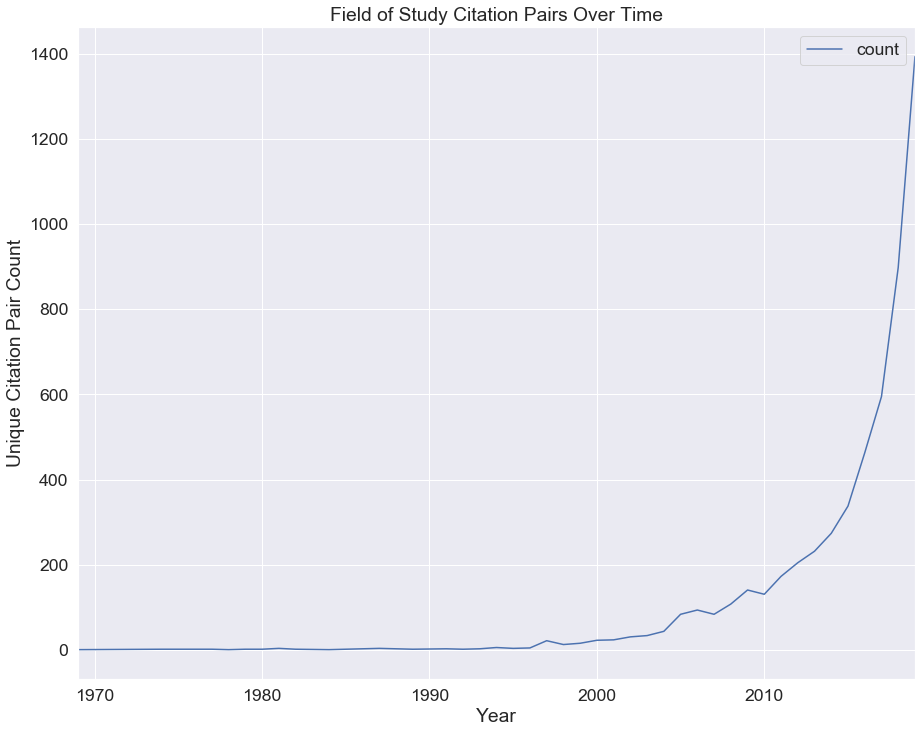

In [126]:
import seaborn as sns 
sns.set(font_scale=1.6)
uniquecitationsfieldsovertime.sort_values('year_src')[:-1].plot(x='year_src', y='count', figsize=(15,12), title = 'Field of Study Citation Pairs Over Time')
plt.ylabel('Unique Citation Pair Count')
plt.xlabel('Year')
plt.show()

### Least frequent citations pairs

In [22]:
LeastFOSpairsCount = g.edges.groupBy("src", "dst").count().orderBy("count", ascending = True)
LeastFOSpairsCount.show(20)

+--------------------+--------------------+-----+
|                 src|                 dst|count|
+--------------------+--------------------+-----+
|Medicine, Enginee...|Computer Science,...|    1|
|Sociology, Psycho...| Economics, Medicine|    1|
|Computer Science,...|    Computer Science|    1|
|    Computer Science|Computer Science,...|    1|
|Medicine, Physics...|    Computer Science|    1|
|Biology, Physics,...|         Mathematics|    1|
|   Medicine, Biology|  History, Geography|    1|
|Computer Science,...|Mathematics, Physics|    1|
|Computer Science,...|Computer Science,...|    1|
|  Chemistry, Physics|Engineering, Comp...|    1|
|Geography, Comput...|             Biology|    1|
|Medicine, Biology...|Materials Science...|    1|
|   Medicine, Biology|Biology, Medicine...|    1|
|Computer Science,...|Computer Science,...|    1|
| Medicine, Geography|Medicine, Biology...|    1|
|Mathematics, Comp...|Mathematics, Comp...|    1|
|Computer Science,...|  Medicine, Business|    1|


In [32]:
least_FOS_pandas = LeastFOSpairsCount.toPandas()

#Least frequent citation pairs of only one FOS
least_FOS_pandas[(~least_FOS_pandas.src.str.contains(','))&(~least_FOS_pandas.dst.str.contains(','))].head()

,src,dst,count
92,Geography,Business,1
109,Physics,Sociology,1
245,Art,Psychology,1
345,History,Environmental Science,1
466,Philosophy,Geology,1


In [50]:
#Check indegree
g.inDegrees.sort("inDegree", ascending=False).show()

+--------------------+--------+
|                  id|inDegree|
+--------------------+--------+
|            Medicine|  128687|
|   Medicine, Biology|   80311|
|   Biology, Medicine|   62414|
|Psychology, Medicine|   32195|
|    Computer Science|   18952|
|             Biology|   16015|
|Mathematics, Comp...|   13672|
| Medicine, Chemistry|   10578|
| Chemistry, Medicine|    8370|
|             Physics|    7106|
|         Mathematics|    6472|
|           Chemistry|    5524|
|Computer Science,...|    4913|
|         Engineering|    4882|
|   Materials Science|    3679|
|             Geology|    3565|
|Medicine, Compute...|    3241|
|Materials Science...|    2982|
|Computer Science,...|    2658|
|Engineering, Comp...|    2588|
+--------------------+--------+
only showing top 20 rows



### Most frequent citations journal pairs

In [57]:
# Most frequent citations journal pairs
journalCount = g.edges.groupBy("journal_name_src", "journal_name_dst").count().orderBy("count", ascending = False)

journalCount.show(10, truncate= False)

+-------------------------------------------------------------------------------+-------------------------------------------------------------------------------+-----+
|journal_name_src                                                               |journal_name_dst                                                               |count|
+-------------------------------------------------------------------------------+-------------------------------------------------------------------------------+-----+
|Blood                                                                          |Blood                                                                          |2150 |
|Journal of High Energy Physics                                                 |Journal of High Energy Physics                                                 |1468 |
|Circulation                                                                    |Circulation                                                                    

### Most frequent citations authors pairs

In [59]:
# Most frequent citations authors pairs
authorsCount = g.edges.groupBy("first_author_src", "last_author_dst").count().orderBy("count", ascending = False)

authorsCount.show(10, truncate= False)

+------------------+---------------------+-----+
|first_author_src  |last_author_dst      |count|
+------------------+---------------------+-----+
|Pirjo Saransaari  |S. S. Oja            |12   |
|Stevo Stevic      |Stevo Stevic         |12   |
|Xian-Ming Zhang   |Qing-Long Han        |10   |
|Jay Armas         |Niels A. Obers       |8    |
|Jennifer C. Felger|Andrew H. Ivan Miller|8    |
|Mauro Mangia      |Gianluca Setti       |8    |
|Elan D Louis      |Elan D Louis         |7    |
|Irina N. Smirnova |H Ronald Kaback      |7    |
|Jean-Lou Justine  |Jean-Lou Justine     |7    |
|Aritoshi Iida     |Yusuke Nakamura      |7    |
+------------------+---------------------+-----+
only showing top 10 rows



### Graphing the graphrames dataframe.

In [27]:
def PlotGraph(edge_list):
    Gplot=nx.Graph()
    for row in edge_list.select('src','dst').take(300):
        Gplot.add_edge(row['src'],row['dst'])

    plt.figure(figsize=(12,12))
    nx.draw(Gplot, with_labels=True)

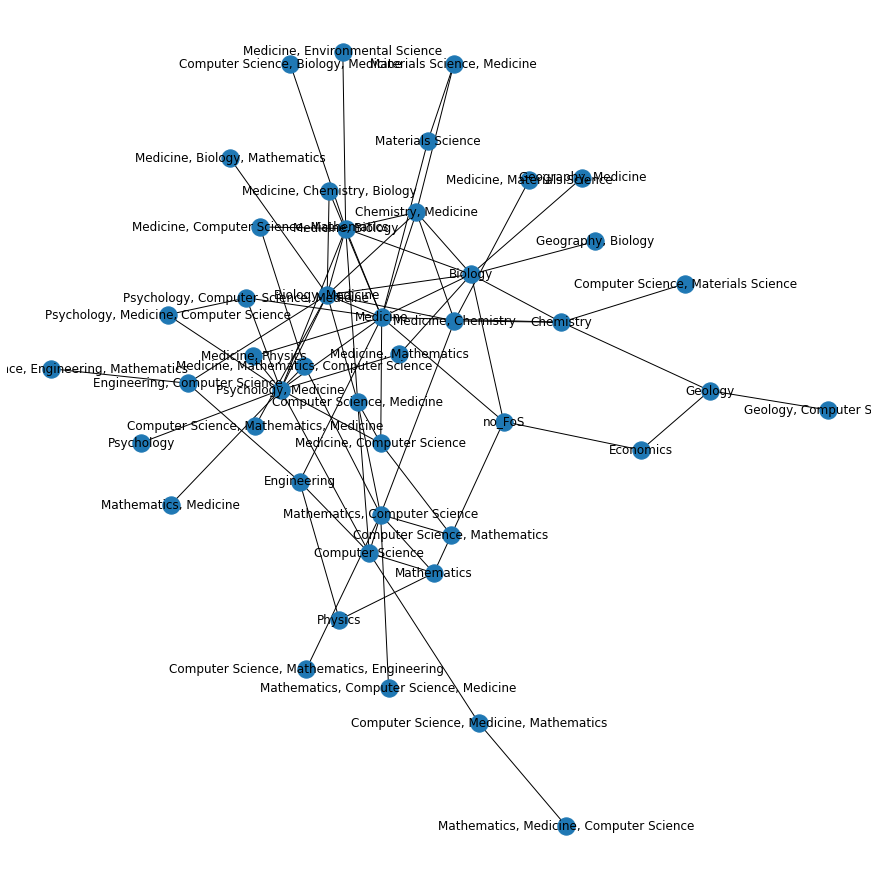

In [28]:
PlotGraph(g.edges)

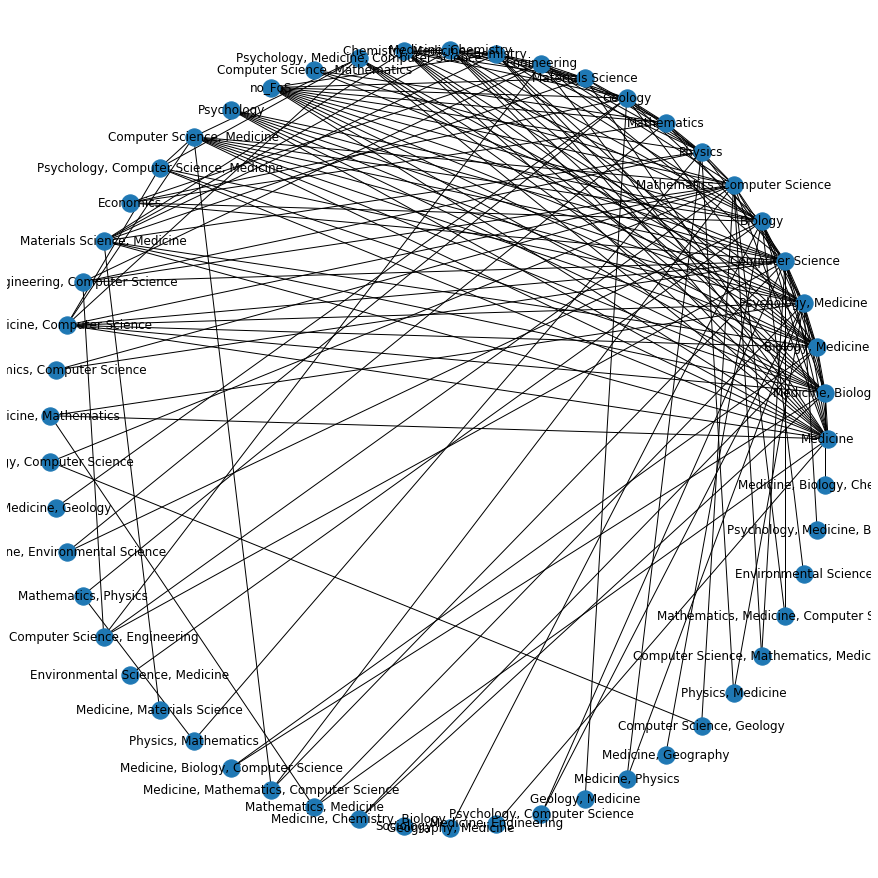

In [39]:
def PlotWeightedGraph(edge_list):
    Gplot=nx.Graph()
    for row in edge_list.select('src','dst', 'count').take(300):
        Gplot.add_edge(row['src'],row['dst'], weight = row['count'])

    plt.figure(figsize=(12,12))
    nx.draw_circular(Gplot, with_labels=True)
    #pos=nx.get_node_attributes(Gplot,'pos')
    #nx.draw(Gplot,pos)
#     labels = nx.get_edge_attributes(Gplot,'weight')
#     nx.draw_networkx_edge_labels(Gplot,pos,edge_labels=labels)
    
PlotWeightedGraph(MostFOSpairsCount)

## Plotting citations counts between different Fields of Study 

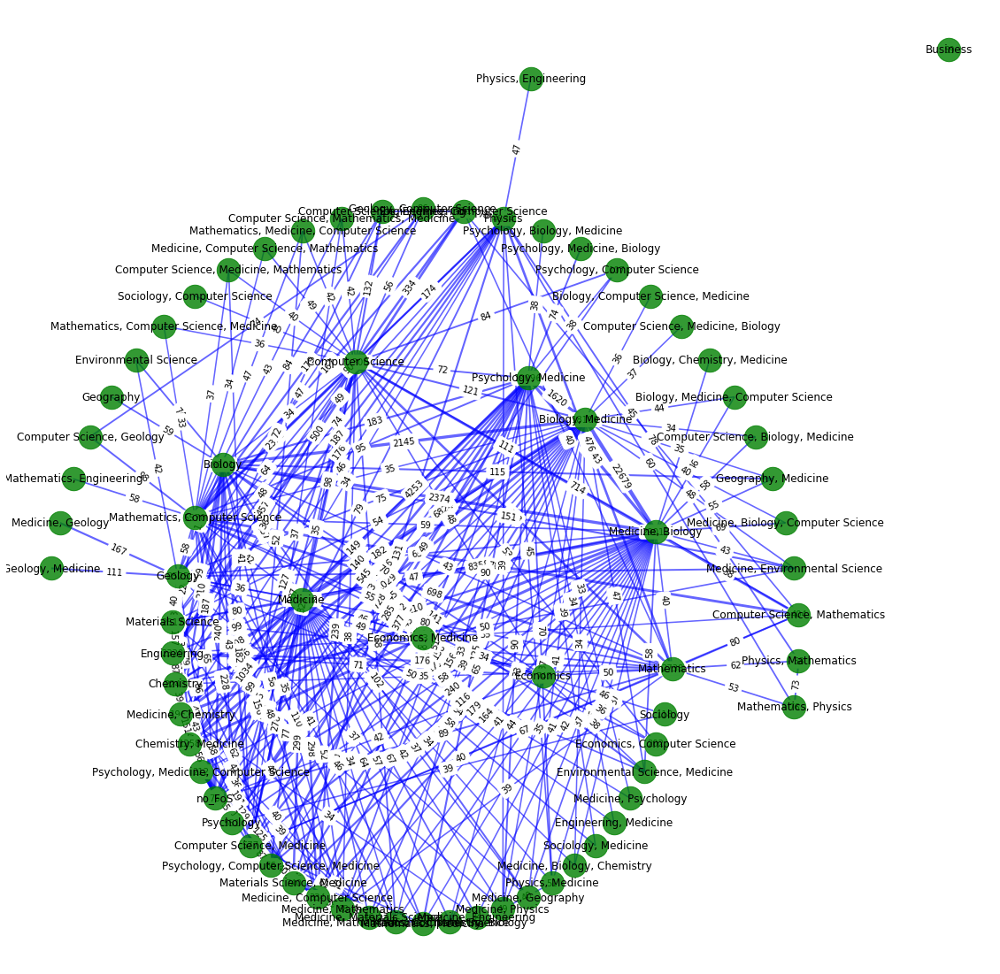

In [46]:
from networkx.drawing.nx_agraph import graphviz_layout

FG=nx.Graph()
for row in MostFOSpairsCount.select('src','dst', 'count').take(500):
    FG.add_edge(row['src'],row['dst'], weight = row['count'])

#pos = graphviz_layout(FG)
# ‘dot’, ‘twopi’, ‘fdp’, ‘sfdp’, ‘circo’
pos = graphviz_layout(FG, prog='twopi', args='')
plt.figure(figsize=(20,20))
plt.axis('off')
nx.draw_networkx_nodes(FG,pos,node_color='g',alpha = 0.8, node_size=700)  # draws nodes

#Get weights
weights = [FG[u][v]['weight'] for u,v in FG.edges()]
nx.draw_networkx_edges(FG,pos,edge_color='b',alpha = 0.6, width=np.log10(weights))  # draws edges
nx.draw_networkx_edge_labels(FG,pos,edge_labels = nx.get_edge_attributes(FG,'weight')) # edge lables
nx.draw_networkx_labels(FG,pos, font_weight=15) # node lables

plt.show()

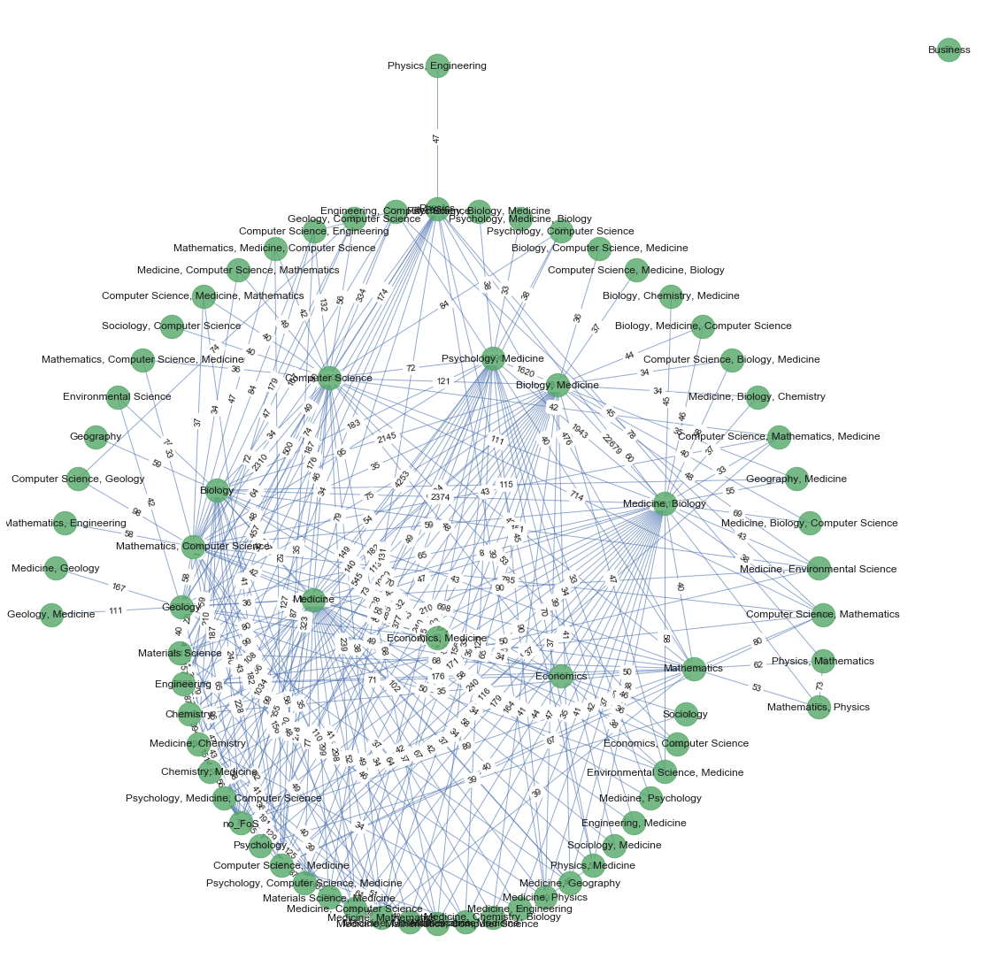

In [199]:
from networkx.drawing.nx_agraph import graphviz_layout

FG=nx.Graph()
for row in MostFOSpairsCount.select('src','dst', 'count').take(500):
    FG.add_edge(row['src'],row['dst'], weight = row['count'])

#pos = graphviz_layout(FG)
# ‘dot’, ‘twopi’, ‘fdp’, ‘sfdp’, ‘circo’
pos = graphviz_layout(FG, prog='twopi', args='')
plt.figure(figsize=(20,20))
plt.axis('off')
nx.draw_networkx_nodes(FG,pos,node_color='g',alpha = 0.8, node_size=700)  # draws nodes

#Get weights
weights = [FG[u][v]['weight'] for u,v in FG.edges()]
nx.draw_networkx_edges(FG,pos,edge_color='b',alpha = 0.6, )#width=np.log(weights))  # draws edges
nx.draw_networkx_edge_labels(FG,pos,edge_labels = nx.get_edge_attributes(FG,'weight')) # edge lables
nx.draw_networkx_labels(FG,pos, font_weight=15) # node lables

plt.show()

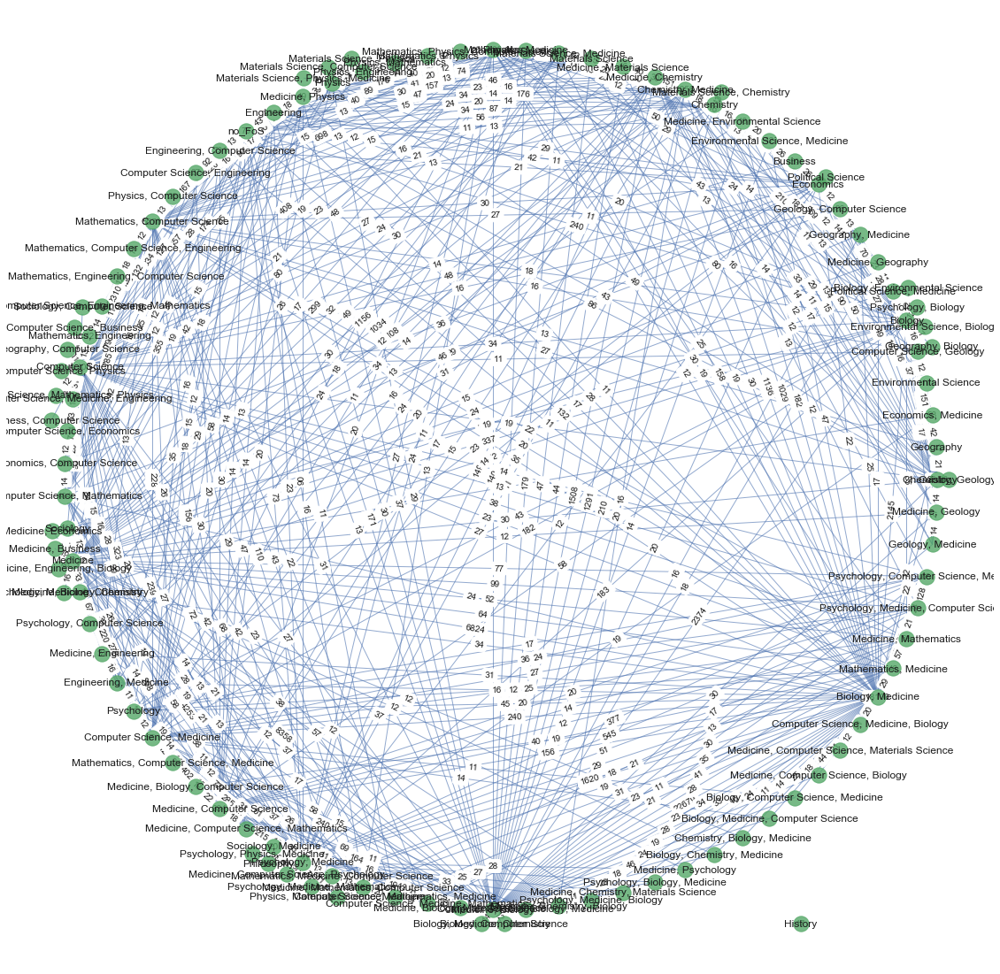

In [132]:
from networkx.drawing.nx_agraph import graphviz_layout

FG=nx.Graph()
for row in MostFOSpairsCount.select('src','dst', 'count').take(1000):
    FG.add_edge(row['src'],row['dst'], weight = row['count'])

#pos = graphviz_layout(FG)
# ‘dot’, ‘twopi’, ‘fdp’, ‘sfdp’, ‘circo’
pos = graphviz_layout(FG, prog='circo', args='')
plt.figure(figsize=(20,20))
plt.axis('off')
nx.draw_networkx_nodes(FG,pos,node_color='g',alpha = 0.8)  # draws nodes

#Get weights
weights = [FG[u][v]['weight'] for u,v in FG.edges()]
nx.draw_networkx_edges(FG,pos,edge_color='b',alpha = 0.6, )#width=np.log(weights))  # draws edges
nx.draw_networkx_edge_labels(FG,pos,edge_labels = nx.get_edge_attributes(FG,'weight')) # edge lables
nx.draw_networkx_labels(FG,pos) # node lables

plt.show()

In [101]:
from pyvis.network import Network
import networkx as nx
from pyvis import network as net

In [102]:
def draw_graph3(networkx_graph,notebook=True,output_filename='graph.html',show_buttons=True,only_physics_buttons=False,
                height=None,width=None,bgcolor=None,font_color=None,pyvis_options=None):
    """
    This function accepts a networkx graph object,
    converts it to a pyvis network object preserving its node and edge attributes,
    and both returns and saves a dynamic network visualization.
    Valid node attributes include:
        "size", "value", "title", "x", "y", "label", "color".
        (For more info: https://pyvis.readthedocs.io/en/latest/documentation.html#pyvis.network.Network.add_node)
    Valid edge attributes include:
        "arrowStrikethrough", "hidden", "physics", "title", "value", "width"
        (For more info: https://pyvis.readthedocs.io/en/latest/documentation.html#pyvis.network.Network.add_edge)
    Args:
        networkx_graph: The graph to convert and display
        notebook: Display in Jupyter?
        output_filename: Where to save the converted network
        show_buttons: Show buttons in saved version of network?
        only_physics_buttons: Show only buttons controlling physics of network?
        height: height in px or %, e.g, "750px" or "100%
        width: width in px or %, e.g, "750px" or "100%
        bgcolor: background color, e.g., "black" or "#222222"
        font_color: font color,  e.g., "black" or "#222222"
        pyvis_options: provide pyvis-specific options (https://pyvis.readthedocs.io/en/latest/documentation.html#pyvis.options.Options.set)
    """

    # import
    from pyvis import network as net

    # make a pyvis network
    network_class_parameters = {"notebook": notebook, "height": height, "width": width, "bgcolor": bgcolor, "font_color": font_color}
    pyvis_graph = net.Network(**{parameter_name: parameter_value for parameter_name, parameter_value in network_class_parameters.items() if parameter_value})

    # for each node and its attributes in the networkx graph
    for node,node_attrs in networkx_graph.nodes(data=True):
        pyvis_graph.add_node(node,**node_attrs)

    # for each edge and its attributes in the networkx graph
    for source,target,edge_attrs in networkx_graph.edges(data=True):
        # if value/width not specified directly, and weight is specified, set 'value' to 'weight'
        if not 'value' in edge_attrs and not 'width' in edge_attrs and 'weight' in edge_attrs:
            # place at key 'value' the weight of the edge
            edge_attrs['value']=edge_attrs['weight']
        # add the edge
        pyvis_graph.add_edge(source,target,**edge_attrs)

    # turn buttons on
    if show_buttons:
        if only_physics_buttons:
            pyvis_graph.show_buttons(filter_=['physics'])
        else:
            pyvis_graph.show_buttons()

    # pyvis-specific options
    if pyvis_options:
        pyvis_graph.set_options(pyvis_options)

    # return and also save
    return pyvis_graph.show(output_filename)


In [204]:
draw_graph3(FG, notebook = True, height=1000,width=1000,output_filename='FOS_Citations_graph.html',show_buttons=True,only_physics_buttons=False, pyvis_options=None)

### Centrality analysis--PageRank. 

In [208]:
results.vertices.show(5)

+------+--------------------+--------------------+-------------------+
|FOS_id|       fieldsOfStudy|                  id|           pagerank|
+------+--------------------+--------------------+-------------------+
|  57.0| Economics, Business| Economics, Business|   0.25471787370521|
| 288.0|Computer Science,...|Computer Science,...|0.30128068057077534|
| 262.0|Materials Science...|Materials Science...| 0.1863144155097611|
|  66.0|Geography, Comput...|Geography, Comput...| 0.8347835779467193|
| 868.0|Medicine, Mathema...|Medicine, Mathema...|0.19937582402830314|
+------+--------------------+--------------------+-------------------+
only showing top 5 rows



In [98]:
results = g.pageRank(resetProbability=0.15, maxIter=10)
results.vertices.sort("pagerank", ascending=False).show()

+------+--------------------+--------------------+------------------+
|FOS_id|       fieldsOfStudy|                  id|          pagerank|
+------+--------------------+--------------------+------------------+
|   0.0|            Medicine|            Medicine| 95.31182392139145|
|   9.0|   Medicine, Biology|   Medicine, Biology| 78.91553539374645|
|  11.0|   Biology, Medicine|   Biology, Medicine| 62.17956393990782|
|  22.0|Psychology, Medicine|Psychology, Medicine| 33.75207371641937|
|   1.0|    Computer Science|    Computer Science|32.388632585174584|
|  25.0|Mathematics, Comp...|Mathematics, Comp...| 28.89974693889713|
|   7.0|             Biology|             Biology|15.256319460684747|
|   8.0|         Mathematics|         Mathematics|15.186701672368748|
|   4.0|             Physics|             Physics|14.964267300651692|
|  20.0| Medicine, Chemistry| Medicine, Chemistry|14.328605844937979|
|  21.0| Chemistry, Medicine| Chemistry, Medicine| 10.74213527095441|
|  14.0|           E

In [ ]:
# results = g.pageRank(resetProbability=0.15, tol=0.01)
# results.vertices.sort("pagerank", ascending=False).show()

## Community detection.

### Computer Science is an enabler or tool that creates groups ?

In [147]:
#Triangle count
result = g.triangleCount()
(result.sort("count", ascending=False)
 .filter('count > 0')
 .show())

+-----+------+--------------------+--------------------+
|count|FOS_id|       fieldsOfStudy|                  id|
+-----+------+--------------------+--------------------+
| 2353|   1.0|    Computer Science|    Computer Science|
| 2346|  11.0|   Biology, Medicine|   Biology, Medicine|
| 2296|   9.0|   Medicine, Biology|   Medicine, Biology|
| 2183|   0.0|            Medicine|            Medicine|
| 2128|  25.0|Mathematics, Comp...|Mathematics, Comp...|
| 1893|   8.0|         Mathematics|         Mathematics|
| 1886|  22.0|Psychology, Medicine|Psychology, Medicine|
| 1806|  32.0|Computer Science,...|Computer Science,...|
| 1794|   5.0|              no_FoS|              no_FoS|
| 1790|  20.0| Medicine, Chemistry| Medicine, Chemistry|
| 1731|   7.0|             Biology|             Biology|
| 1589|  21.0| Chemistry, Medicine| Chemistry, Medicine|
| 1573|  33.0|Medicine, Compute...|Medicine, Compute...|
| 1497|   3.0|         Engineering|         Engineering|
| 1472|  30.0|Computer Science,

## Strongly connected components: a graph is said to be strongly connected if every vertex is reachable from every other vertex

In [215]:
from pyspark.sql import functions as F
#Strongly connected components
result = g.stronglyConnectedComponents(maxIter=10)
(result.sort("component")
 .groupby("component")
 .agg(F.collect_list("id").alias("fieldsOfStudy"))
 .show())

+-----------+--------------------+
|  component|       fieldsOfStudy|
+-----------+--------------------+
|          0|[Biology, Compute...|
|          1|[Economics, Busin...|
|          2|[Economics, Mathe...|
|          4|[Geology, Biology...|
|          6|[Sociology, Geogr...|
| 8589934593|[Environmental Sc...|
|17179869184|[Chemistry, Physi...|
|17179869186|[Mathematics, Phy...|
|25769803776|[Biology, Medicin...|
|25769803777|  [History, Biology]|
|34359738368|[Medicine, Chemis...|
|34359738370|[Physics, Materia...|
|42949672960|[Biology, Psychol...|
|51539607552|[Computer Science...|
|51539607553|[Computer Science...|
|51539607554|[Geography, Physi...|
|51539607555|[Medicine, Physic...|
|68719476736|[Biology, Medicin...|
|77309411328|[Computer Science...|
|77309411329|[Computer Science...|
+-----------+--------------------+
only showing top 20 rows



In [133]:
# strong_components_pandas = result.toPandas()
# strong_components_pandas.to_csv('strongcomp.csv')

#Read in the strong_component prop
strong_components_pandas = pd.read_csv('strongcomp.csv')

In [82]:
strong_components_pandas.head()

,Unnamed: 0,FOS_id,fieldsOfStudy,id,component
0,0,57.0,"Economics, Business","Economics, Business",1
1,1,288.0,"Computer Science, Physics, Medicine","Computer Science, Physics, Medicine",1
2,2,262.0,"Materials Science, Biology","Materials Science, Biology",1
3,3,66.0,"Geography, Computer Science","Geography, Computer Science",1
4,4,868.0,"Medicine, Mathematics, Psychology","Medicine, Mathematics, Psychology",833223655426


In [106]:
print("There are a total of {} strongly connected components.".format(strong_components_pandas.component.nunique()))

There are a total of 296 strongly connected components.


## Let's color the top nodes based on labels from the SC

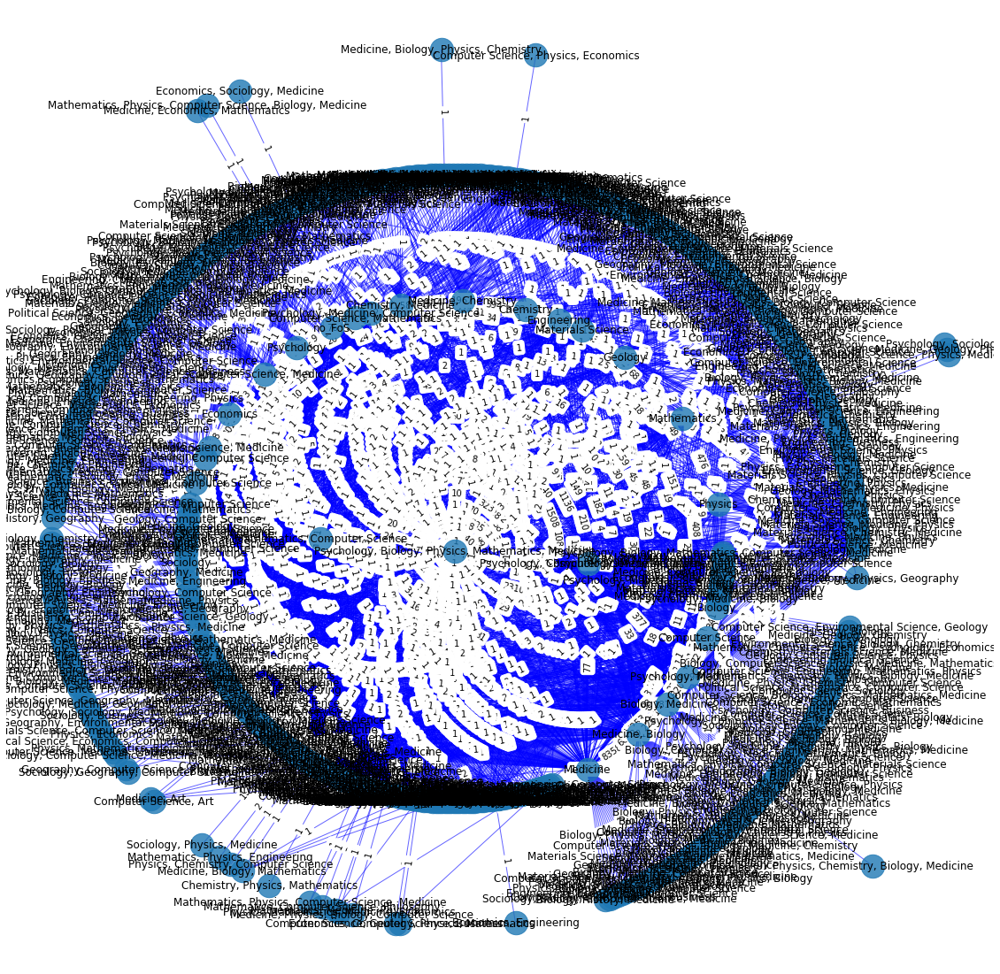

In [131]:
from networkx.drawing.nx_agraph import graphviz_layout

FG=nx.Graph()
for row in MostFOSpairsCount.select('src','dst', 'count').collect():
    FG.add_edge(row['src'],row['dst'], weight = row['count'])


In [134]:
# Here is the tricky part: I need to reorder labelprop_pandas to assign the good color to each node
strong_components_pandas= strong_components_pandas.set_index('id')
strong_components_pandas=strong_components_pandas.reindex(FG.nodes())

In [135]:
# And I need to transform my categorical column in a numerical value: group1->1, group2->2...
strong_components_pandas['component']=pd.Categorical(strong_components_pandas['component'])
strong_components_pandas['component'].cat.codes[:5]

id
Medicine                1
Medicine, Biology       1
Biology, Medicine       1
Psychology, Medicine    1
Computer Science        1
dtype: int16

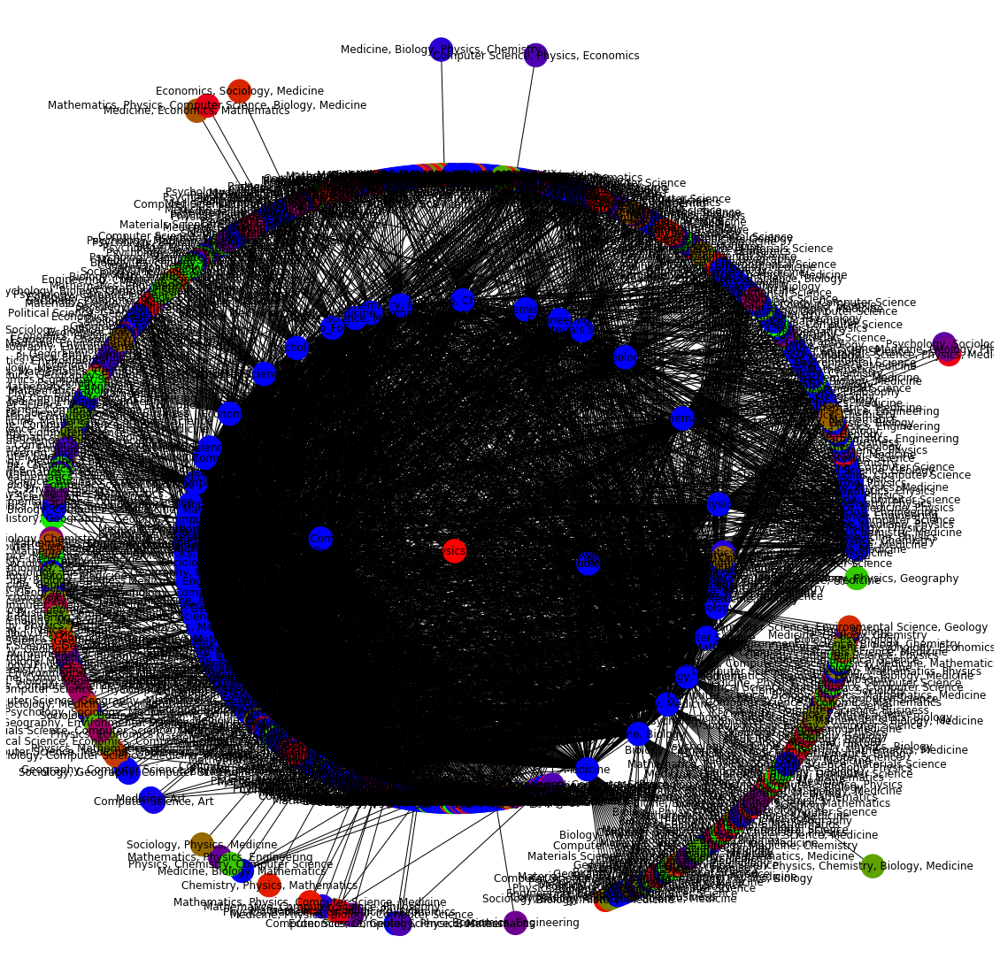

In [137]:
pos = graphviz_layout(FG, prog='twopi', args='')
plt.figure(figsize=(20,20))
plt.axis('off')
# Custom the nodes:
nx.draw(FG, pos, with_labels=True, node_color = strong_components_pandas['component'].cat.codes, cmap=plt.cm.brg, node_size=700)

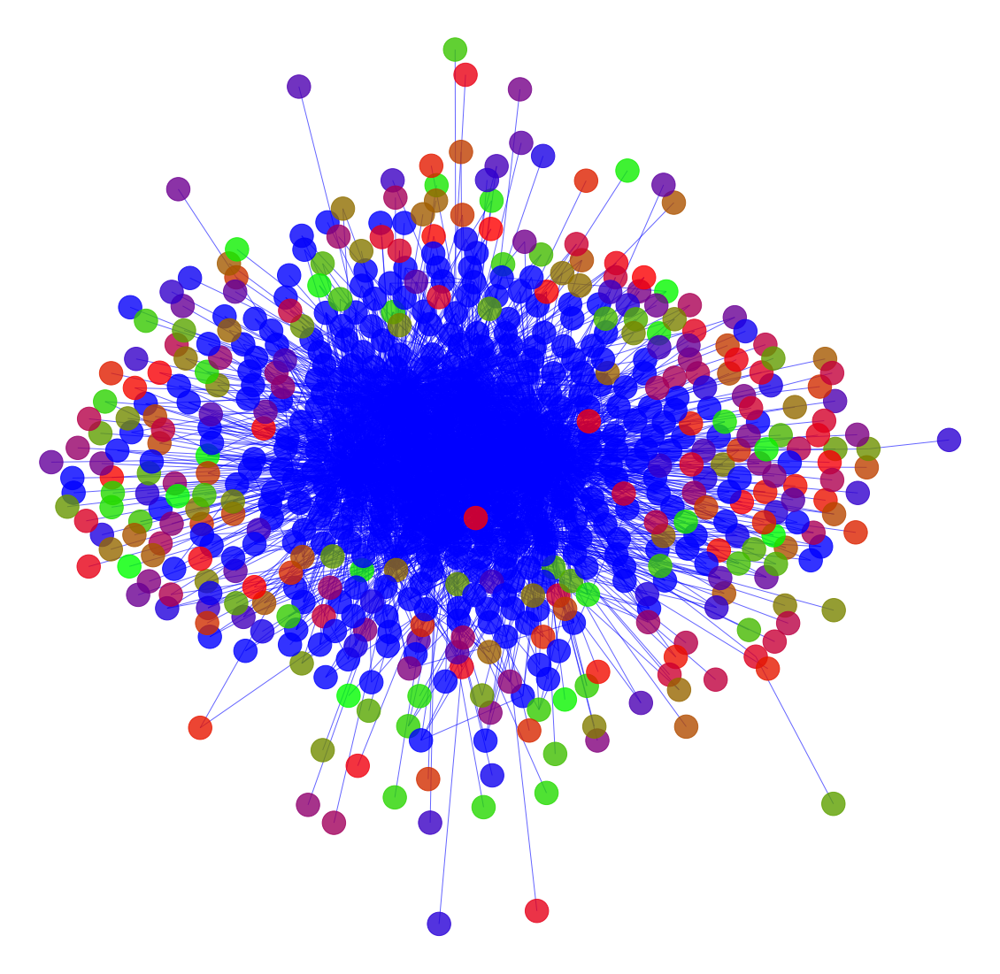

In [141]:
from networkx.drawing.nx_agraph import graphviz_layout

# FG=nx.Graph()
# for row in MostFOSpairsCount.select('src','dst', 'count'):
#     FG.add_edge(row['src'],row['dst'], weight = row['count'])

#pos = graphviz_layout(FG)
# ‘dot’, ‘twopi’, ‘fdp’, ‘sfdp’, ‘circo’
pos = graphviz_layout(FG, prog='fdp', args='')
plt.figure(figsize=(20,20))
plt.axis('off')
nx.draw_networkx_nodes(FG,pos,node_color=strong_components_pandas['component'].cat.codes, cmap=plt.cm.brg, node_size=700,alpha = 0.8)  # draws nodes

#Get weights
#weights = [FG[u][v]['weight'] for u,v in FG.edges()]
nx.draw_networkx_edges(FG,pos,edge_color='b',alpha = 0.6)#width=np.log(weights))  # draws edges
#nx.draw_networkx_edge_labels(FG,pos,edge_labels = nx.get_edge_attributes(FG,'weight')) # edge lables
#nx.draw_networkx_labels(FG,pos) # node lables

plt.show()

## To make the visualization interactive let's use pyvis 

### First we need to map an individual color to each of the 296 SC components

In [148]:
import matplotlib.pyplot as plt
from pylab import *

num_categories = strong_components_pandas.component.nunique()
colors_hex = []
#cmap = plt.cm.get_cmap(plt.cm.brg, num_categories)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", plt.cm.viridis.colors, N=num_categories)
for i in range(cmap.N):
    rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
    colors_hex.append(matplotlib.colors.rgb2hex(rgb))
    
colors_hex[:5]

['#440154', '#440255', '#450357', '#450558', '#450659']

In [149]:
#Mapping color to component
SC_color_map_hex = dict(zip(strong_components_pandas.component.unique(), colors_hex))

#applying the map
id_to_color_hex = strong_components_pandas.component.map(SC_color_map_hex)

#Setting the node attributes to the map colors 
SC_component_map = dict(strong_components_pandas['component'].items())
nx.set_node_attributes(FG, values = id_to_color_hex, name='color')

In [152]:
#Drawing graph using function defined above (converts networkx to pyvis)
draw_graph3(FG, notebook = True, height=1000,width=1000,output_filename='FOS_SC_graph.html',show_buttons=True,only_physics_buttons=False, pyvis_options=None)

## The Label Propagation algorithm (LPA) is a fast algorithm for finding communities in a graph. It detects these communities using network structure alone as its guide, and doesn’t require a pre-defined objective function or prior information about the communities.

In [214]:
#Label propagation
result_LP = g.labelPropagation(maxIter=10)
(result_LP
.sort("label")
.groupby("label")
.agg(F.collect_list("id"))
.show())

+-------------+--------------------+
|        label|    collect_list(id)|
+-------------+--------------------+
|  60129542145|[Philosophy, Comp...|
| 188978561025|[Economics, Compu...|
| 214748364800|[Art, Computer Sc...|
| 257698037761|[Geology, Physics...|
| 257698037765|[Computer Science...|
| 566935683073|[Materials Scienc...|
| 592705486848|[Mathematics, Che...|
| 609885356036|[Sociology, Socio...|
| 781684047875|[Psychology, Comp...|
| 833223655425|[Materials Scienc...|
| 901943132160|           [History]|
| 970662608900|[Computer Science...|
| 987842478080|[Economics, Physi...|
|1090921693187|[Medicine, Econom...|
|1099511627776|[Engineering, Com...|
|1133871366146|[Mathematics, Phy...|
|1185410973698|[Medicine, Comput...|
|1202590842880|          [Business]|
|1314259992579|[Engineering, Mat...|
|1477468749824|[Computer Science...|
+-------------+--------------------+
only showing top 20 rows



In [34]:
# labelprop_pandas = result_LP.toPandas()
# labelprop_pandas.to_csv('labelprop_FOS.csv')

#Read in the label prop
labelprop_pandas = pd.read_csv('labelprop_FOS.csv')

In [114]:
labelprop_pandas.head()

,FOS_id,fieldsOfStudy,id,label
0,57.0,"Economics, Business","Economics, Business",1529008357378
1,288.0,"Computer Science, Physics, Medicine","Computer Science, Physics, Medicine",1477468749824
2,262.0,"Materials Science, Biology","Materials Science, Biology",833223655425
3,66.0,"Geography, Computer Science","Geography, Computer Science",1477468749824
4,868.0,"Medicine, Mathematics, Psychology","Medicine, Mathematics, Psychology",833223655425


In [37]:
print("Label Propogation found a total of {} communities.".format(labelprop_pandas.label.nunique()))

Label Propogation found a total of 25 communities.


## Similarly as above, now let's color the top nodes based on labels from the label propogation algorithm.

In [ ]:
# Here is the tricky part: I need to reorder labelprop_pandas to assign the good color to each node
labelprop_pandas= labelprop_pandas.set_index('id')
labelprop_pandas=labelprop_pandas.reindex(FG.nodes())

In [234]:
# And I need to transform my categorical column in a numerical value: group1->1, group2->2...
labelprop_pandas['label']=pd.Categorical(labelprop_pandas['label'])
labelprop_pandas['label'].cat.codes[:5]

id
Medicine                10
Medicine, Biology        7
Biology, Medicine        7
Psychology, Medicine     2
Computer Science        15
dtype: int8

In [ ]:
pos = graphviz_layout(FG, prog='twopi', args='')
plt.figure(figsize=(20,20))
plt.axis('off')
# Custom the nodes:
nx.draw(FG, pos, with_labels=True, node_color=labelprop_pandas['label'].cat.codes, cmap=plt.cm.tab20, node_size=700)

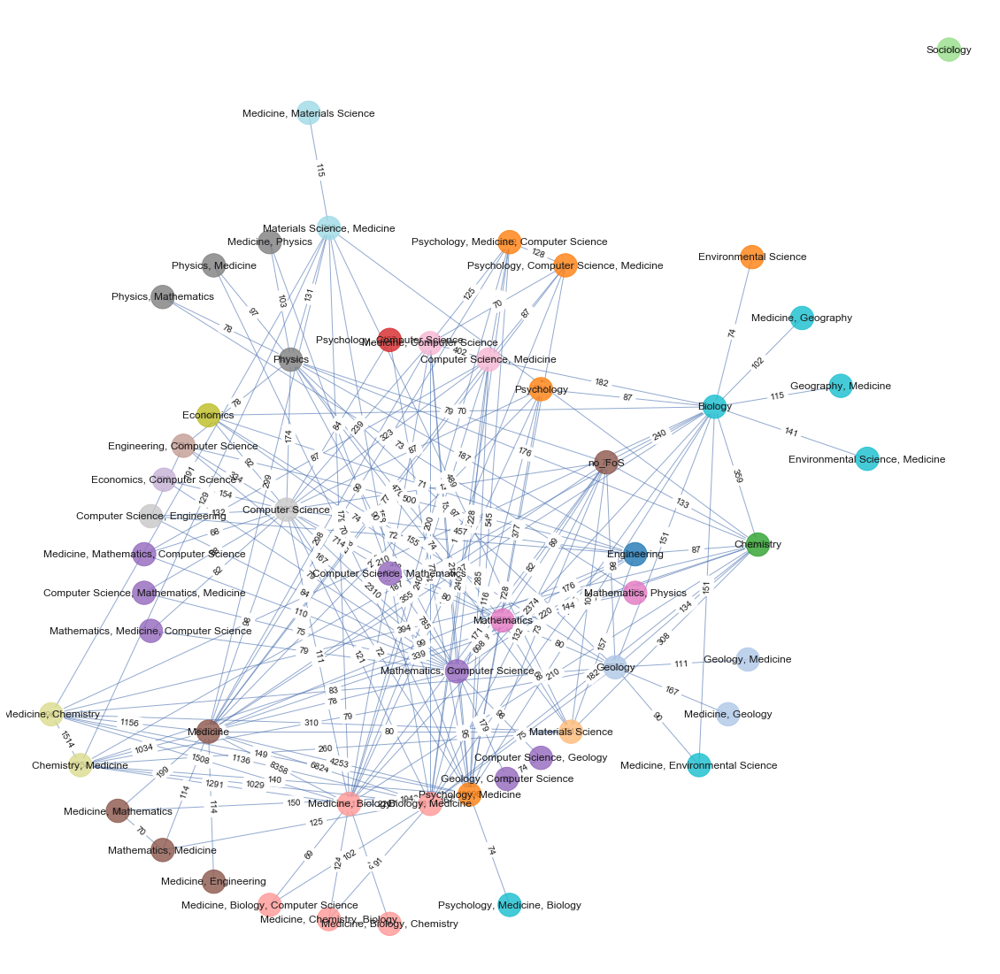

In [315]:
from networkx.drawing.nx_agraph import graphviz_layout

FG=nx.Graph()
for row in MostFOSpairsCount.select('src','dst', 'count').take(300):
    FG.add_edge(row['src'],row['dst'], weight = row['count'])

#pos = graphviz_layout(FG)
# ‘dot’, ‘twopi’, ‘fdp’, ‘sfdp’, ‘circo’
pos = graphviz_layout(FG, prog='twopi', args='')
plt.figure(figsize=(20,20))
plt.axis('off')
nx.draw_networkx_nodes(FG,pos,node_color=labelprop_pandas['label'].cat.codes, cmap=plt.cm.tab20, node_size=700,alpha = 0.8)  # draws nodes

#Get weights
weights = [FG[u][v]['weight'] for u,v in FG.edges()]
nx.draw_networkx_edges(FG,pos,edge_color='b',alpha = 0.6)#width=np.log(weights))  # draws edges
nx.draw_networkx_edge_labels(FG,pos,edge_labels = nx.get_edge_attributes(FG,'weight')) # edge lables
nx.draw_networkx_labels(FG,pos) # node lables

plt.show()

## To make the visualization interactive let's use pyvis 

### First we need to map an individual color to each of the 296 SC components

In [302]:
import matplotlib.pyplot as plt
from pylab import *

num_categories = labelprop_pandas.label.nunique()
colors_hex = []
cmap = plt.cm.get_cmap(plt.cm.tab20, num_categories)
for i in range(cmap.N):
    rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
    colors_hex.append(matplotlib.colors.rgb2hex(rgb))
    
colors_hex[:5]

['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c']

In [303]:
label_color_map_hex = dict(zip(labelprop_pandas.label.unique(), colors_hex))

In [307]:
id_to_color_hex = labelprop_pandas.label.map(label_color_map_hex)

In [308]:
LP_label_map = dict(labelprop_pandas['label'].items())
nx.set_node_attributes(FG, values = id_to_color_hex, name='color')

In [310]:
draw_graph3(FG, notebook = True, height=1000,width=1000,output_filename='FOS_LP_graph.html',show_buttons=True,only_physics_buttons=False, pyvis_options=None)

In [95]:
def PlotGraphRandom(edge_list):
    Gplot=nx.Graph()
    for row in edge_list.select('src','dst').take(500):
        Gplot.add_edge(row['src'],row['dst'])

    plt.figure(figsize=(12,12))
    nx.draw_random(Gplot,with_labels=True)  
    

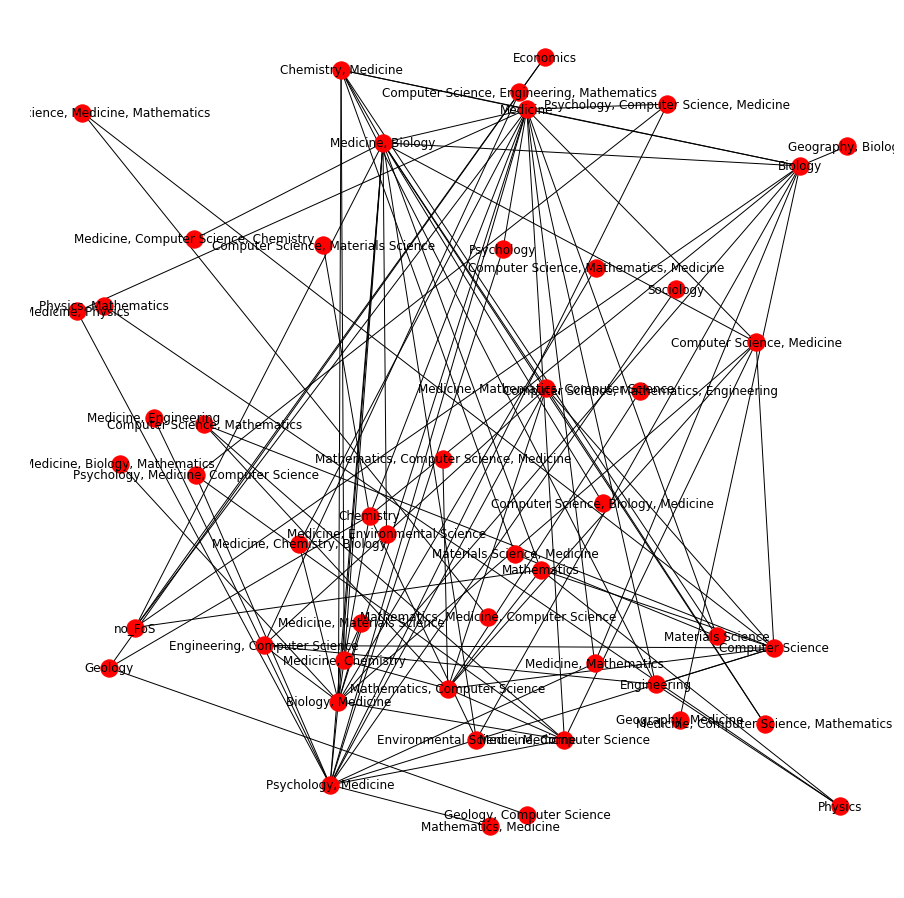

In [96]:
PlotGraphRandom(g.edges)

In [127]:
def PlotGraphCircular(edge_list):
    Gplot=nx.Graph()
    for row in edge_list.select('src','dst').take(300):
        Gplot.add_edge(row['src'],row['dst'])

    plt.figure(figsize=(11,11))
    nx.draw_circular(Gplot,with_labels=True)   
    

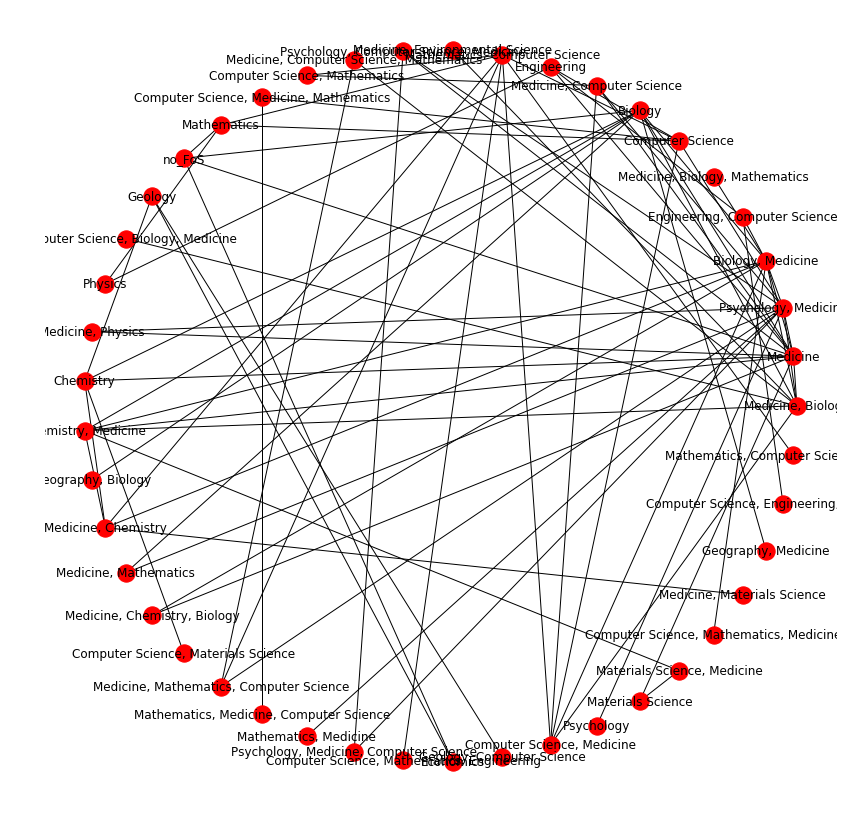

In [128]:
PlotGraphCircular(g.edges)

## Spectral Graph: Positions nodes using the eigenvectors of the graph Laplacian.

In [99]:
def PlotGraphSpectral(edge_list):
    Gplot=nx.Graph()
    for row in edge_list.select('src','dst').take(500):
        Gplot.add_edge(row['src'],row['dst'])

    plt.figure(figsize=(12,12))
    nx.draw_spectral(Gplot,with_labels=True)  
    

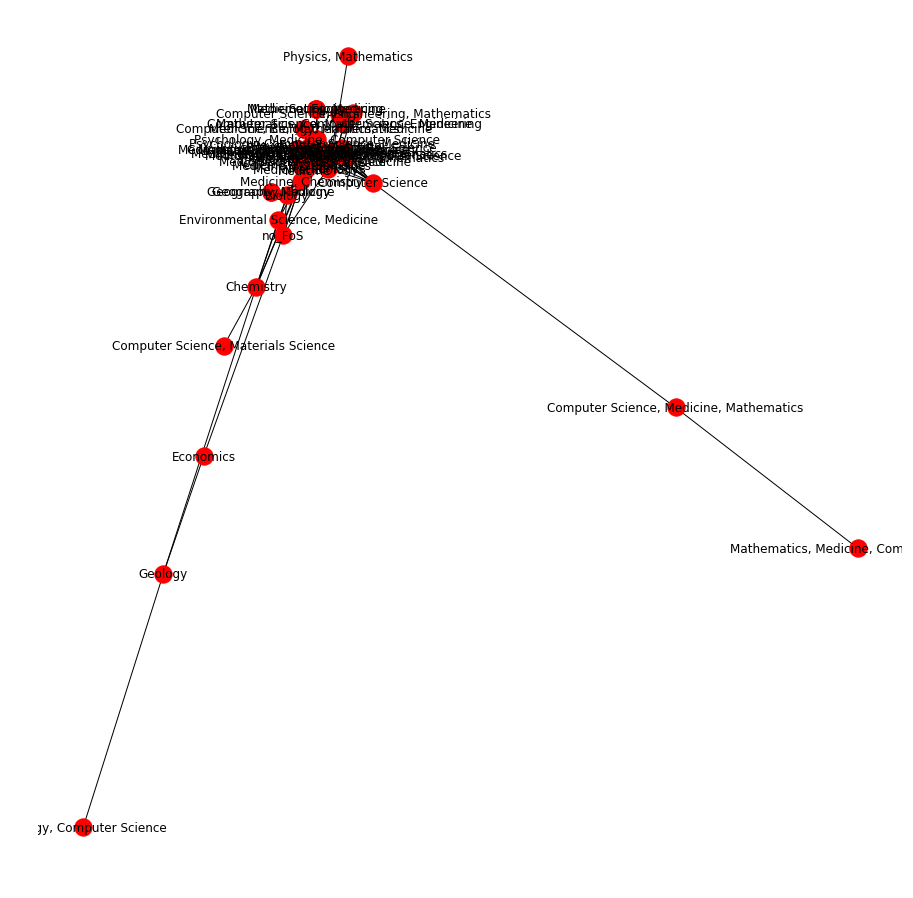

In [100]:
PlotGraphSpectral(g.edges)

In [94]:
def PlotGraphSpring(edge_list):
    Gplot=nx.Graph()
    for row in edge_list.select('src','dst').take(100):
        Gplot.add_edge(row['src'],row['dst'])

    plt.figure(figsize=(12,12))
    nx.draw_spring(Gplot,with_labels=True) 
    

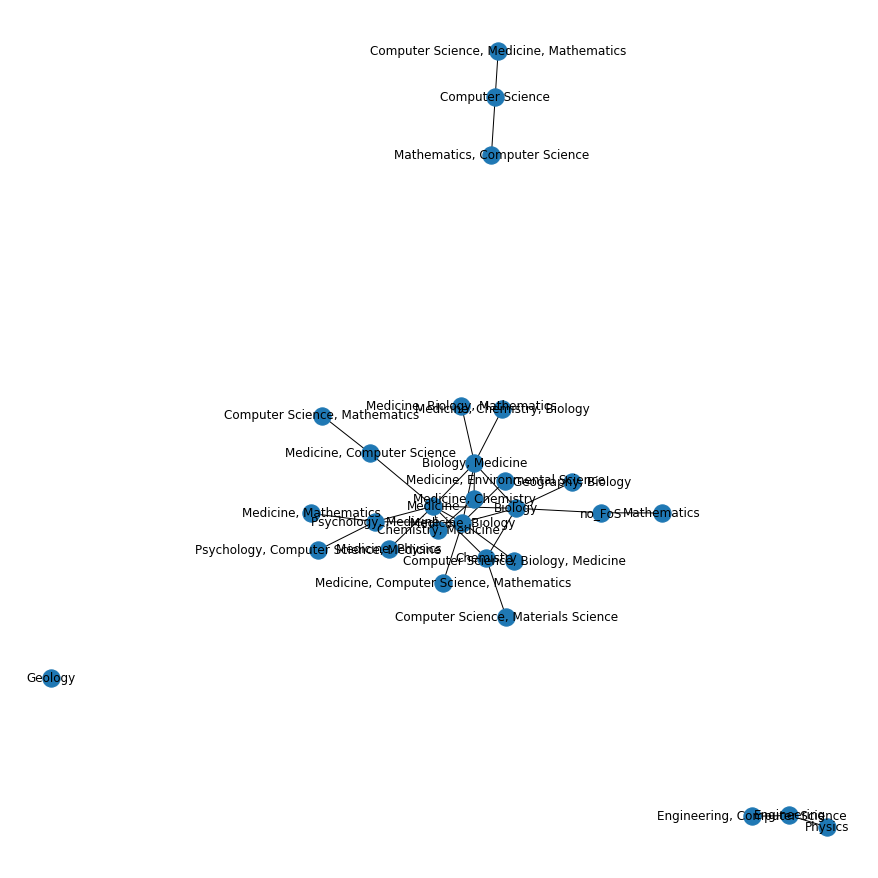

In [95]:
PlotGraphSpring(g.edges)

### Pathfinding analysis.

### Lastly let us look at the shortest path between two fields.

In [47]:
result=g.bfs("id = 'Medicine'" , "id = 'Art'")

In [97]:
print(result.columns)

['from', 'e0', 'to']


In [138]:
columns = [column for column in result.columns if not column.startswith("e")]
result.select(columns).show(truncate=False)

+-------------------------+----------------+
|from                     |to              |
+-------------------------+----------------+
|[0.0, Medicine, Medicine]|[13.0, Art, Art]|
+-------------------------+----------------+



In [139]:
result.show(truncate=False)

+-------------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------------+
|from                     |e0                                                                                                                                                                                                                          |to              |
+-------------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------------+
|[0.0, Medicine, Medicine]|[0f6591eea8d649440944ce8adcdbe61b49076da2, Medicine, Art, 0.0, 13.0, 2019, 1992, PLoS ONE, Leonardo Music Journal, Tatsuya Daikoku, Leonard C. Manzara, Tatsuya Daikoku, Leonar

In [145]:
papers_df.filter(papers_df.id == '0f6591eea8d649440944ce8adcdbe61b49076da2').select('title', 'author_names', 'journal_name', 'year').show()

+--------------------+--------------------+--------------------+----+
|               title|        author_names|        journal_name|year|
+--------------------+--------------------+--------------------+----+
|on the entropy of...|[Leonard C. Manza...|Leonardo Music Jo...|1992|
+--------------------+--------------------+--------------------+----+



# END
---------------